# Assignment Lab 10 - Nicolas Duboc

In [1]:
import context
from IPython.display import Image
import matplotlib.pyplot as plt
# make the plots happen inline
%matplotlib inline
# import the numpy array handling library
import numpy as np
# import the advection code from the numlabs directory
import numlabs.lab10.advection_funs_nic as afs

******************************
context imported. Front of path:
/Users/zuni/repos/numeric_2024
back of path: /Users/zuni/miniconda3/envs/numeric_2024/lib/python3.12/site-packages
******************************

through /Users/zuni/repos/numeric_2024/notebooks/lab10/context.py


## part a

Since the problem is pure advection, our accuracy will be measured by how well the amplitude of the gaussian distribution of water vapor is preserved by the end of the simulation. Below are 4 plots representing 4 different polynomial approximations with a Courant Number of 0.4: 

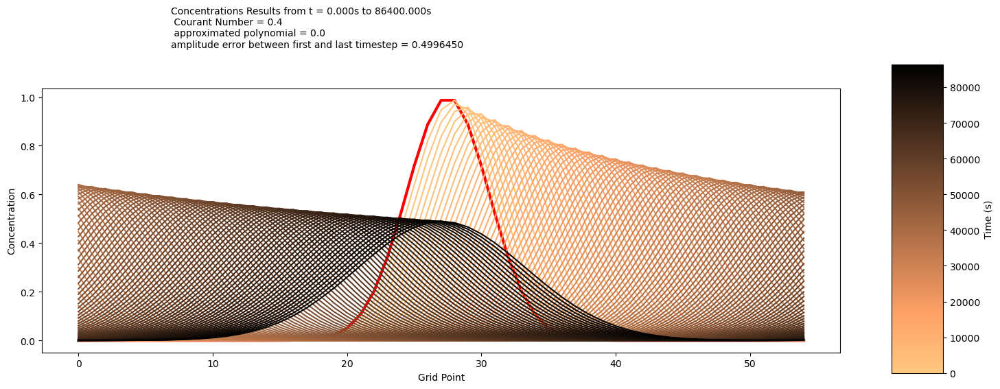

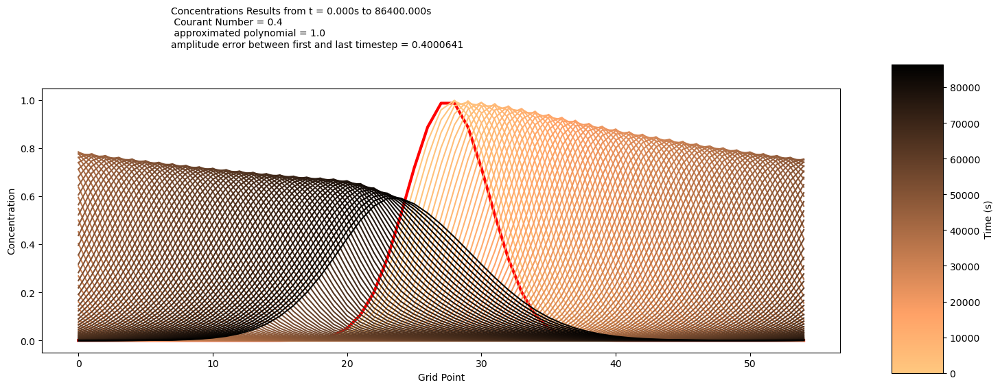

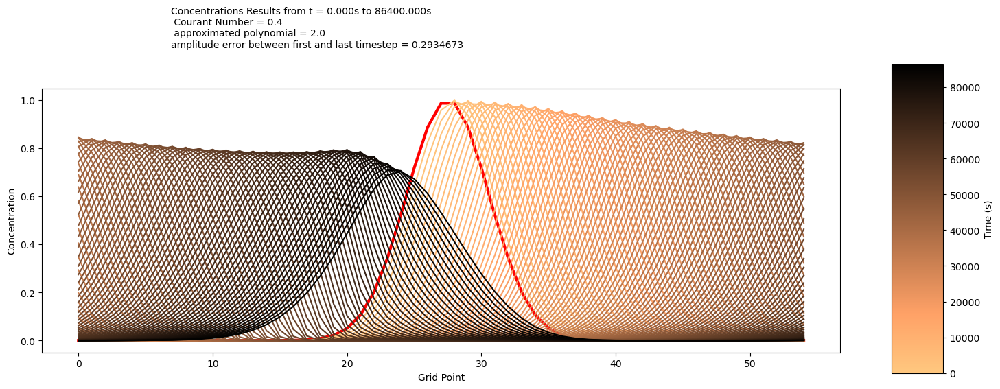

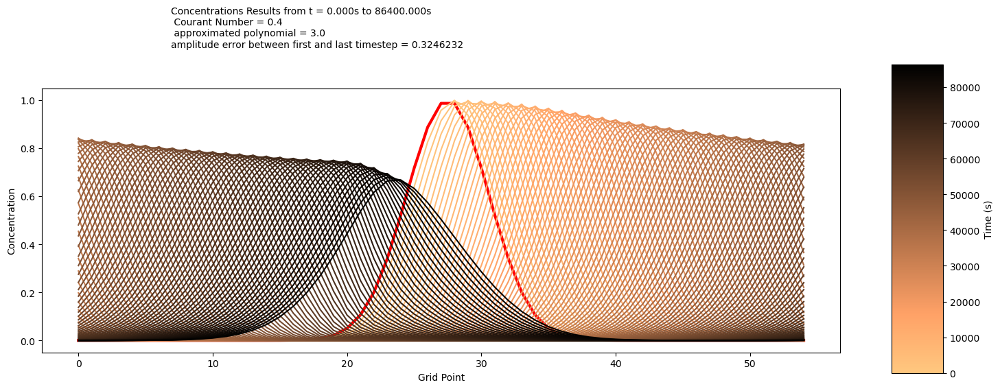

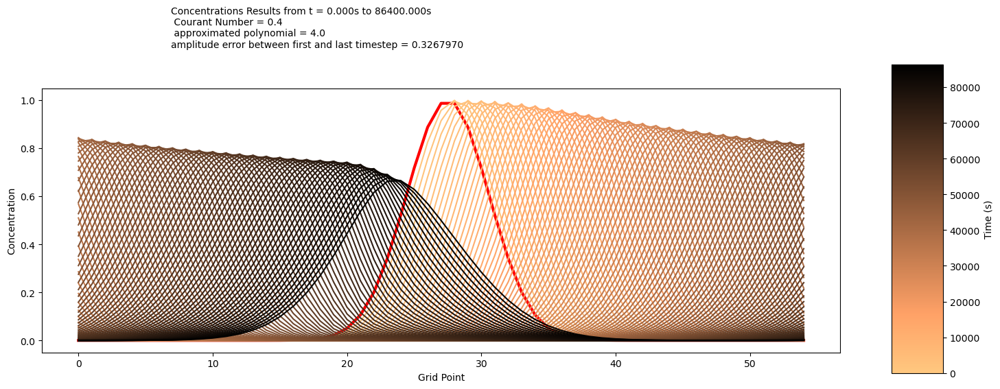

In [3]:
ms = np.empty((5,126,55))
for i in range(5):
    ms[i,:,:] = afs.advection3(125, i, 0.4,'right')
    # errors.append(abs(np.max(ms[i,-1,:])-np.max(ms[i,0,:])))

The Botts scheme shows that the error in amplitude between the first and last timesteps generally decreases with some exceptions. For example, the error at $l=2$ is much less than the error at $l=4$. This might be due to the fact that the initial state of the water vapor distribution is of power 2, allowing the $l=2$ approximation to be more stable.

Below are plots with a lower courant number. 

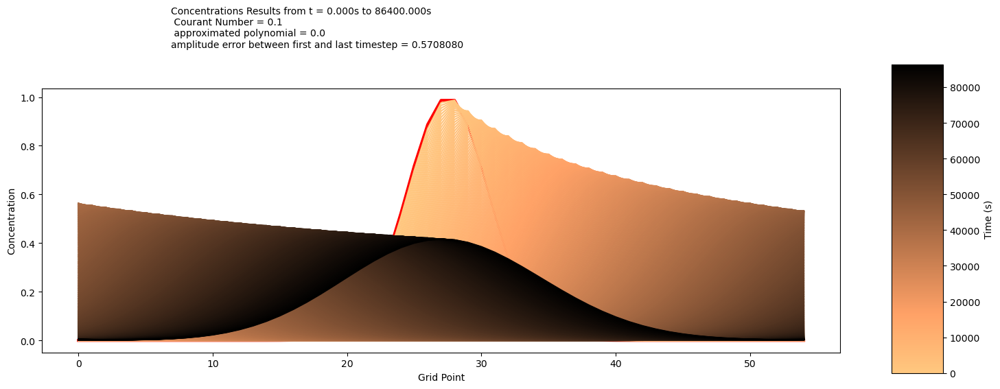

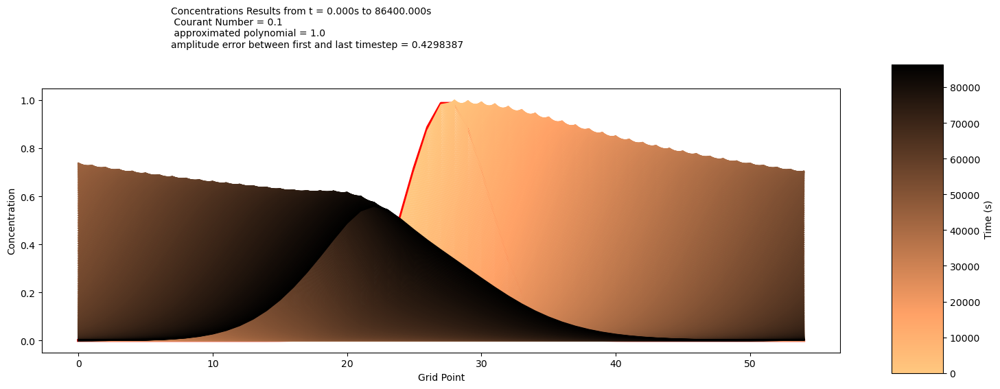

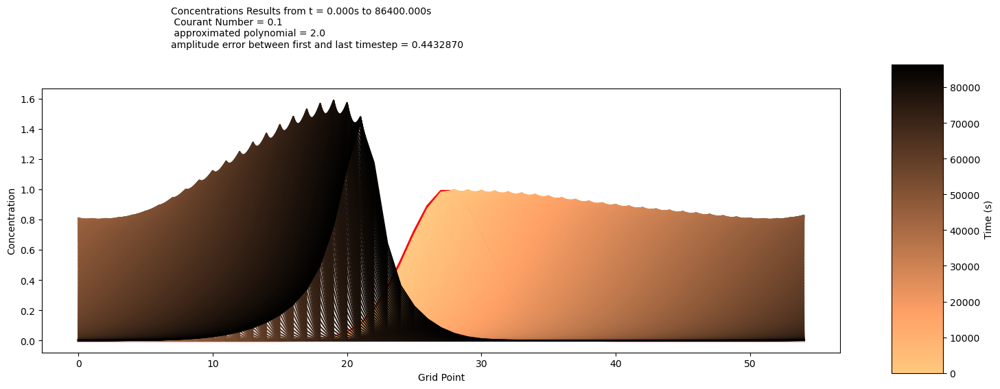

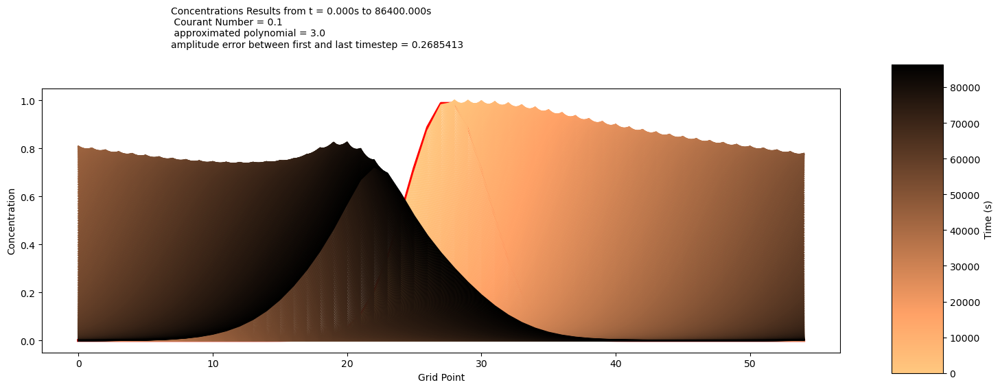

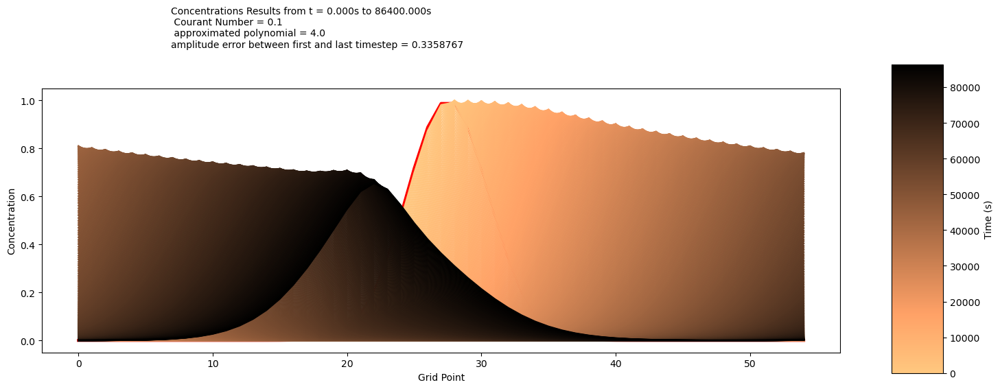

In [16]:
ms1 = np.empty((5,501,55))
for i in range(5):
    ms1[i,:,:] = afs.advection3(500, i, 0.1,'right')

This set of plots show that decreasing the courant number increases the error. This is especially prominant when $l=2$, causing a significant blow up. This is most likely due to the fact that imposing a small courant number in this scheme limits the range of $\partial t$, $\partial x$, and $u$ for which the scheme can stay stable. The odd valued polynomial approximations also show the gaussian distribution is slightly slanted. This can seen more clearly at $l=1$.

## part b

Below are plots using a courant number of $Cr = 0.4$ for a polynomial approximation of $l=1$ and $l=3$. These approximations use the extra point to the left of the centred grid point.

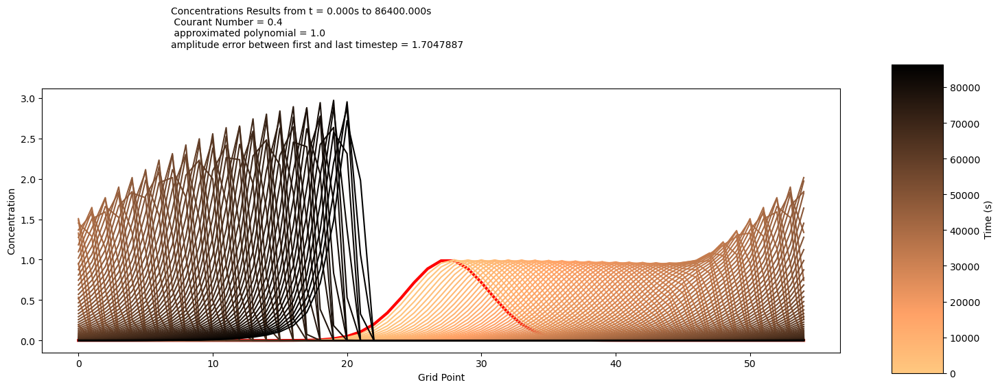

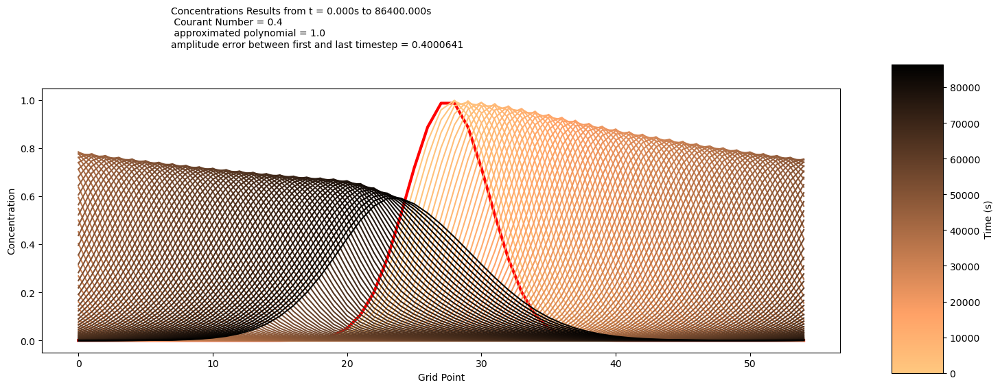

In [13]:
ms2 = afs.advection3(125, 1, 0.4,'left')
ms3 = afs.advection3(125, 1, 0.4,'right')

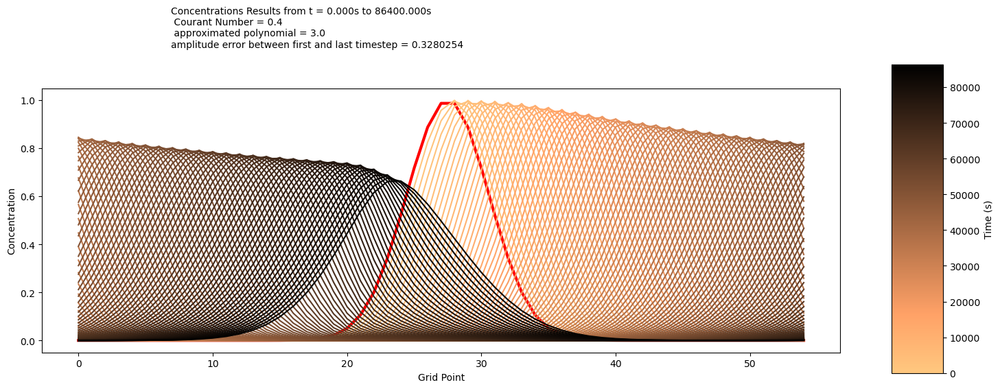

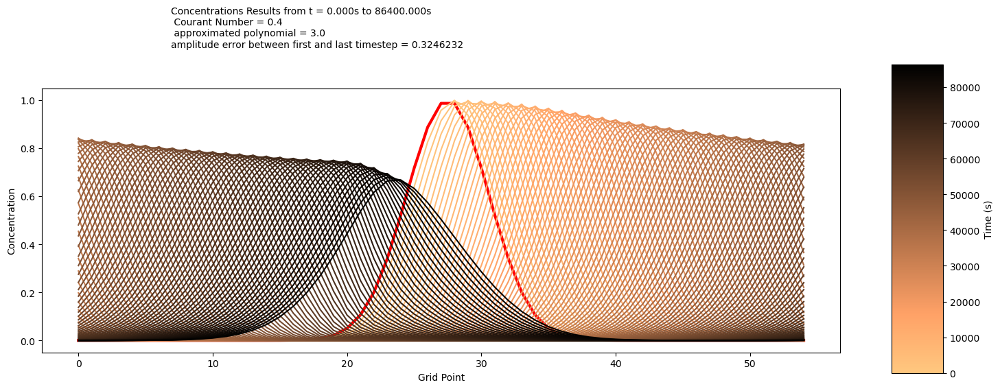

In [14]:
ms4 = afs.advection3(125, 3, 0.4,'left')
ms4 = afs.advection3(125, 3, 0.4,'right')

The plots above represent 4 different scenarios using 2 different polynomial approximations $l=1$ and $l=3$. The former polynomial approximation has significant blow-up using the extra term on the left side of the centered point. Conversely, $l=3$ remains relatively stable and has a very similar (but still slightly greater) error than its right-from-centered counterpart. The reason for the greater error using the left-from-centered point could be due to the fact that the water vapor is being advected in the positive j direction, allowing the scheme to more accurately predict its shape in the next timestep. 
